In [1]:
%pip install plotly

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from scipy.stats import zscore as zs
from scipy import linalg as scipy_linalg
from sklearn.model_selection import train_test_split as split
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM, GRU
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, mean_squared_log_error
from numpy.random import seed
seed(1)
import tensorflow
tensorflow.random.set_seed(1)
from keras.optimizers import SGD
from IPython.display import display, Image

In [57]:
##Matplotlib Parameters
import matplotlib.ticker as ticker
from pylab import rcParams
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 12
rcParams['ytick.labelsize'] = 12
plt.style.context('fivethirtyeight')

# Data Description :-

In [58]:
file_path = 'https://raw.githubusercontent.com/lavibula/GoldPricePrediction/main/data/data_preparation/data_preparation.csv'
gold_df = pd.read_csv(file_path)
gold_df.head(2)

,Date,GOLD_open,GOLD_high,GOLD_low,GOLD_close,copper,crude_oil,DXY,EURUSD,MSCI,NASDAQ,NLR,platinum,RUT,silver,SP500,VIX
0,2023-11-03,1993.5,2011.9,1989.3,1999.2,3.6815,80.51,105.02,1.0732,497.76,13478.28,71.36,944.3,1760.71,23.285,4358.34,14.91
1,2023-11-02,1992.0,1999.2,1986.3,1993.5,3.6725,82.46,106.12,1.0622,487.02,13294.19,72.14,930.6,1714.21,22.846,4317.78,15.66


In [59]:
gold_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3423 entries, 0 to 3422
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        3423 non-null   object 
 1   GOLD_open   3423 non-null   float64
 2   GOLD_high   3423 non-null   float64
 3   GOLD_low    3423 non-null   float64
 4   GOLD_close  3423 non-null   float64
 5   copper      3423 non-null   float64
 6   crude_oil   3423 non-null   float64
 7   DXY         3423 non-null   float64
 8   EURUSD      3423 non-null   float64
 9   MSCI        3423 non-null   float64
 10  NASDAQ      3423 non-null   float64
 11  NLR         3423 non-null   float64
 12  platinum    3423 non-null   float64
 13  RUT         3423 non-null   float64
 14  silver      3423 non-null   float64
 15  SP500       3423 non-null   float64
 16  VIX         3423 non-null   float64
dtypes: float64(16), object(1)
memory usage: 454.7+ KB


In [60]:
gold_df.describe().drop(['25%', '50%', '75%']).transpose()

,count,mean,std,min,max
GOLD_open,3423.0,1488.210488,267.533166,1051.5000,2076.4000
GOLD_high,3423.0,1498.695998,269.780564,1062.7000,2089.2000
GOLD_low,3423.0,1476.962869,264.782930,1045.4000,2049.0000
GOLD_close,3423.0,1487.994332,267.328340,1049.6000,2069.4000
copper,3423.0,3.247181,0.671831,1.9435,4.9375
crude_oil,3423.0,71.627350,22.241466,11.5700,123.7000
DXY,3423.0,91.413742,9.025438,72.9300,114.1000
EURUSD,3423.0,1.195920,0.112538,0.9596,1.4831
MSCI,3423.0,189.348583,186.302973,25.5900,675.1500
NASDAQ,3423.0,6943.137756,3890.770421,2091.7900,16057.4400


In [61]:
##Checking Missing Values
gold_df.isnull().sum()

Date          0
GOLD_open     0
GOLD_high     0
GOLD_low      0
GOLD_close    0
copper        0
crude_oil     0
DXY           0
EURUSD        0
MSCI          0
NASDAQ        0
NLR           0
platinum      0
RUT           0
silver        0
SP500         0
VIX           0
dtype: int64

In [62]:
##Converting Date column as DateTime format
gold_df['Date'] = pd.to_datetime(gold_df['Date'],format='%Y-%m-%d')

In [63]:
gold_df.dtypes

Date          datetime64[ns]
GOLD_open            float64
GOLD_high            float64
GOLD_low             float64
GOLD_close           float64
copper               float64
crude_oil            float64
DXY                  float64
EURUSD               float64
MSCI                 float64
NASDAQ               float64
NLR                  float64
platinum             float64
RUT                  float64
silver               float64
SP500                float64
VIX                  float64
dtype: object

In [64]:
##Setting Date as Index
gold_df.set_index('Date',inplace=True)

In [65]:
gold_df.head(2)

,GOLD_open,GOLD_high,GOLD_low,GOLD_close,copper,crude_oil,DXY,EURUSD,MSCI,NASDAQ,NLR,platinum,RUT,silver,SP500,VIX
Date,,,,,,,,,,,,,,,,
2023-11-03,1993.5,2011.9,1989.3,1999.2,3.6815,80.51,105.02,1.0732,497.76,13478.28,71.36,944.3,1760.71,23.285,4358.34,14.91
2023-11-02,1992.0,1999.2,1986.3,1993.5,3.6725,82.46,106.12,1.0622,487.02,13294.19,72.14,930.6,1714.21,22.846,4317.78,15.66


# Exploratory Data Analysis(EDA)

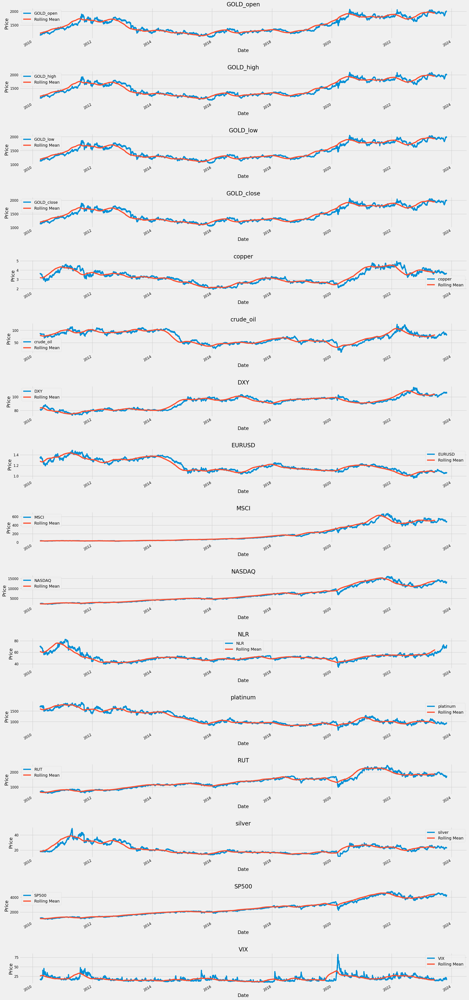

In [66]:
##Line Plots Target & Features
data = gold_df
col_names = data.columns

fig = plt.figure(figsize=(24, 50))
plt.style.use('fivethirtyeight')
for i in range(16):
  ax = fig.add_subplot(16,1,i+1)
  ax.plot(data.iloc[:,i],label=col_names[i])
  data.iloc[:,i].rolling(100).mean().plot(label='Rolling Mean')
  ax.set_title(col_names[i])
  ax.set_xlabel('Date')
  ax.set_ylabel('Price')
  plt.legend()
fig.tight_layout(pad=3.0)
plt.show()



<ipython-input-67-9a7c091cea0b>:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-67-9a7c091cea0b>:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-67-9a7c091cea0b>:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use ei

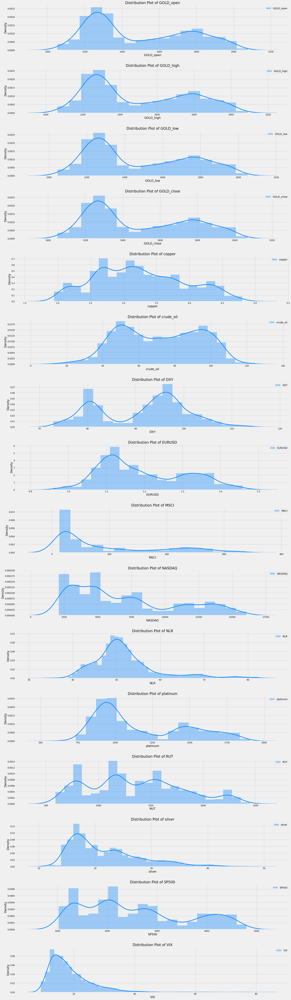

In [67]:
##Checking if Target and Features follow Normal Distribution
data = gold_df
fig = plt.figure(figsize=(24, 80))
plt.style.use('fivethirtyeight')
col_names = data.columns
for i in range(16):
  ax = fig.add_subplot(16,1,i+1)
  sns.distplot(data.iloc[:,i],label=col_names[i],color='dodgerblue').set_title("Distribution Plot of {}".format(col_names[i]),axes=ax)
  ax.tick_params(labelsize=12)
  plt.legend()
fig.tight_layout(pad=3.0)
plt.show()

From above Distribution plots :-

-> Most frequent values of GOLD are in the range of 1200 to 1400.

-> The GOLD price values above 2000 are less frequent.

-> All Features & GOLD don't follow Normal Distribution.

In [68]:
## Temporary DataFrame
temp_data = gold_df
temp_data['Year'] = gold_df.index.year

Text(0.5, 1.0, 'Box Plot Year Wise-GOLD')

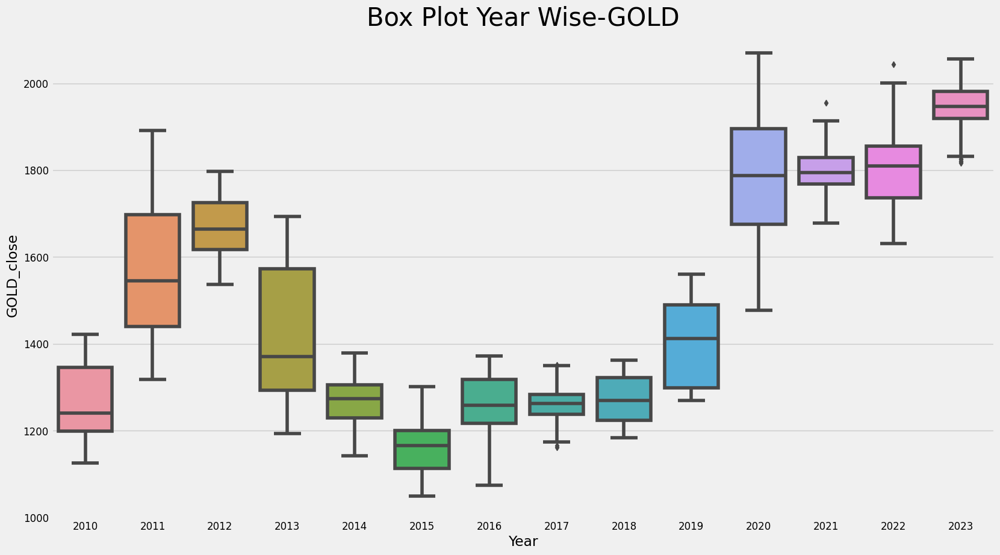

In [69]:
##Box Plot Year Wise WTI
plt.figure(figsize=(18,10))
ax = sns.boxplot(x=temp_data['Year'], y=temp_data['GOLD_close'])
ax.set_title('Box Plot Year Wise-GOLD',fontsize=30)

-> Years 2017, 2021 and 2022 show some outliers.

<ipython-input-70-e8193a067400>:17: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



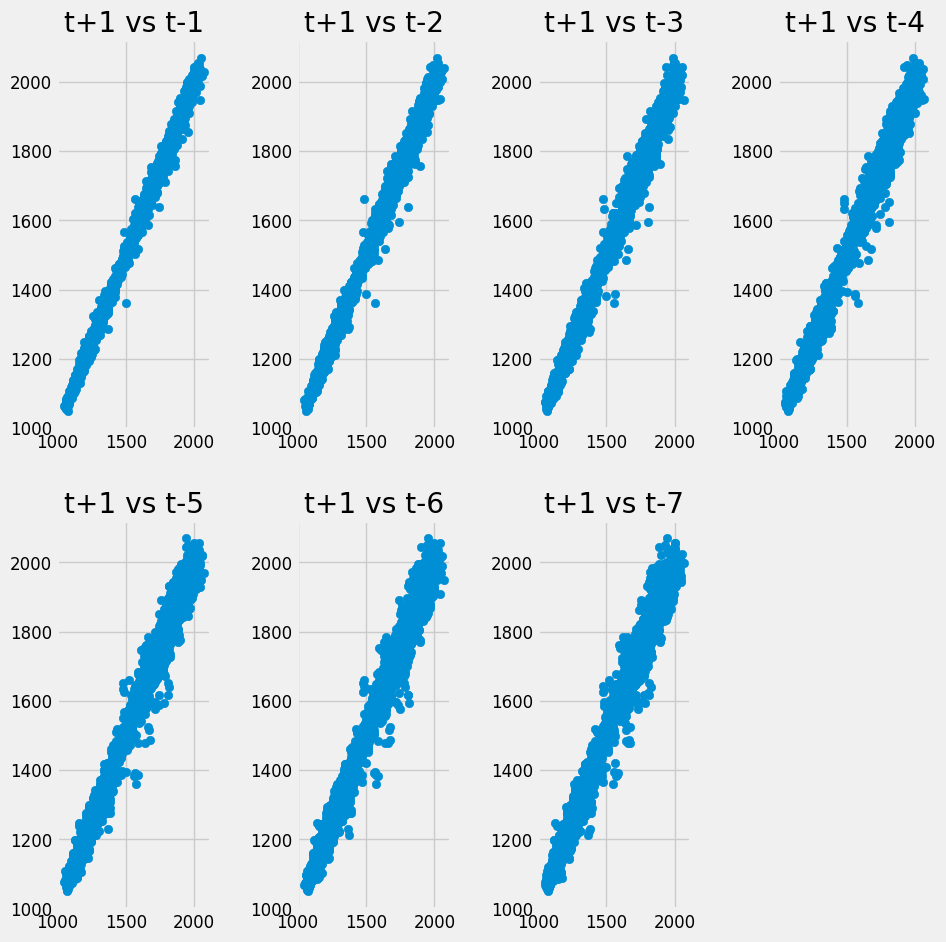

In [70]:
##Checking Series Lag Relationship(Auto-Correlation Nature)
plt.figure(figsize=(10,10))
pd.plotting.lag_plot(gold_df['GOLD_close'])
wti_series = gold_df['GOLD_close']
n_lags = 7
cols = [wti_series]

for i in range(1,(n_lags + 1)):
	cols.append(wti_series.shift(i))
df = pd.concat(cols, axis=1)
cols = ['t+1']
for i in range(1,(n_lags + 1)):
	cols.append('t-' + str(i))
df.columns = cols
plt.figure(1)
for i in range(1,(n_lags + 1)):
	ax = plt.subplot(240 + i)
	ax.set_title('t+1 vs t-' + str(i))
	plt.scatter(x=df['t+1'].values, y=df['t-'+str(i)].values)
plt.tight_layout(pad=2)
plt.show()

-> The above Lag plot indicates that GOLD has good positive correlation with each of its lagging orders.

-> This kind of series is good for time series as its showing auto-regressive nature.

## Bivariate Analysis (GOLD and Features)

In [71]:
gold_df.drop(labels=['Year'],axis=1,inplace=True)

In [72]:
##Scaling Data to Observe Bivariate Analysis
sc = MinMaxScaler(feature_range=(0,1))
gold_df_scaled= sc.fit_transform(gold_df)

Since distribution is not normal we use Standardisation instead of Normalization.

In [73]:
##Scaled Data Glimse
gold_df_scaled[:2]

array([[0.91911406, 0.92469557, 0.94051415, 0.93116297, 0.58049432,
        0.61482208, 0.77945106, 0.21700096, 0.72690745, 0.81532116,
        0.77232235, 0.26549011, 0.63187439, 0.31262389, 0.88388386,
        0.07845003],
       [0.9176505 , 0.91232343, 0.93752491, 0.92557364, 0.57748831,
        0.63221261, 0.80616954, 0.19598854, 0.71037318, 0.80213954,
        0.78848146, 0.2550233 , 0.60677602, 0.30070329, 0.87313658,
        0.08864718]])

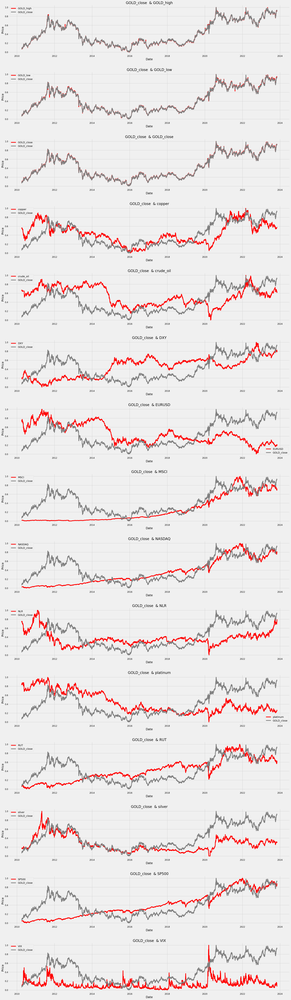

In [74]:
##Comparing Movement of WTI wrt to Features
col_names = data.columns[1:]
scaled_features = gold_df_scaled[:,1:]
fig = plt.figure(figsize=(24, 80))
plt.style.use('fivethirtyeight')
for i in range(15):
  ax = fig.add_subplot(15,1,i+1)
  ax.plot(gold_df.index,scaled_features[:,i],label=col_names[i],c='red')
  ax.plot(gold_df.index,gold_df_scaled[:,0],label='GOLD_close',c='grey')
  ax.set_title('GOLD_close  & ' + col_names[i])
  ax.set_xlabel('Date')
  ax.set_ylabel('Price')
  plt.legend()
fig.tight_layout(pad=3.0)
plt.show()

Inferences From Bivariate Feature Analysis :-
....

## Multivariate Analysis

In [75]:
import plotly.express as px


gold_df_reset = gold_df.reset_index(drop=True)

fig = px.parallel_coordinates(
    gold_df_reset,
    color='GOLD_close',
    color_continuous_scale=px.colors.diverging.Tealrose,
    title='Parallel Co-ordinates Plot'
)

fig.show()


- Inferences From Parallel Co-ordinates Plot :-
...
- Since Target & Feature don't follow normal distribution , we will use Spearman Correlation.

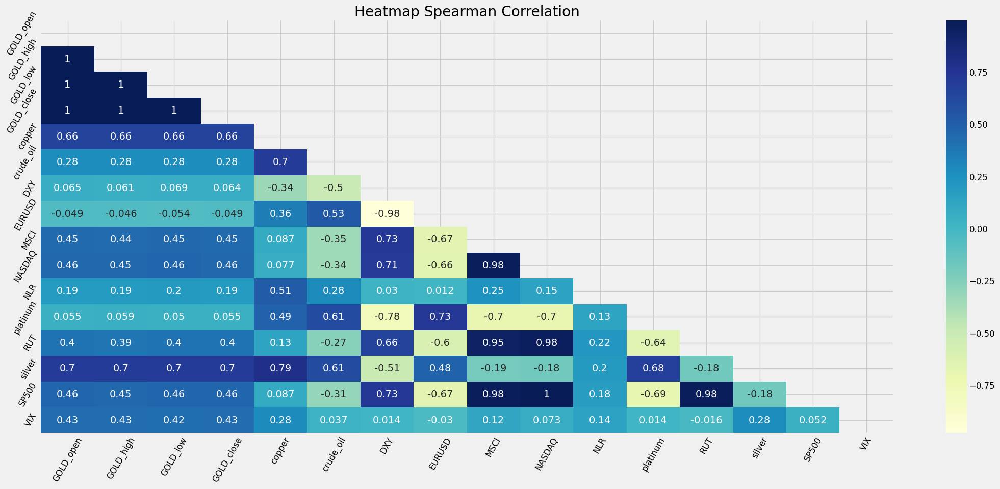

In [76]:
##HeatMap Spearman Correlation
plt.figure(figsize=(24,10))
matrix = np.triu(gold_df.corr(method='spearman'))
heat_map = sns.heatmap(gold_df.corr(method='spearman'),annot=True,annot_kws={"size":14},cmap= 'YlGnBu',mask=matrix)
heat_map.set_yticklabels(heat_map.get_yticklabels(), rotation=60)
heat_map.set_xticklabels(heat_map.get_xticklabels(), rotation=60)
plt.tick_params(labelsize=12)
plt.title('Heatmap Spearman Correlation')
plt.style.use('fivethirtyeight')

- > The highest positive correlation with target variable GOLD_close is with silver (ρ:0.7)
- > We also observe that FED and GOLD_close have less correlation.(ρ : 0.073)
- > EURUSD and GOLD_close are moderately inversely correlated.(ρ : -0.056)
- > MSCI, NASDAQ, RUT, SP500, VIX & GOLD_close positive moderate correlation.(ρ : 0.4 - 0.5 )







## Feature Selection
We eliminate features by Filteration technique and use correlation factor .
- >We eliminate all features having spearman correlation less than magnitude of 0.4.


In [77]:
##Feature Selection
after_fs = gold_df[['GOLD_close','GOLD_high', 'GOLD_low', 'GOLD_open', 'copper', 'MSCI', 'NASDAQ', 'RUT', 'silver', 'SP500', 'VIX']]
after_fs.head(3)

,GOLD_close,GOLD_high,GOLD_low,GOLD_open,copper,MSCI,NASDAQ,RUT,silver,SP500,VIX
Date,,,,,,,,,,,
2023-11-03,1999.2,2011.9,1989.3,1993.5,3.6815,497.76,13478.28,1760.71,23.285,4358.34,14.91
2023-11-02,1993.5,1999.2,1986.3,1992.0,3.6725,487.02,13294.19,1714.21,22.846,4317.78,15.66
2023-11-01,1987.5,2005.9,1978.2,1993.3,3.6490,471.85,13061.47,1669.70,22.790,4237.86,16.87


### **Trend**

In [78]:
gold_df.reset_index(inplace=True)

In [79]:
df=gold_df

In [80]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


def corr(feature):
    scaler = MinMaxScaler()
    df_normalized = pd.DataFrame(scaler.fit_transform(df[['GOLD_close', feature]]), columns=['GOLD_close', feature])
    df_normalized['Date'] = df['Date']

    plt.figure(figsize=(30, 6))
    plt.plot(df_normalized['Date'], df_normalized['GOLD_close'], linestyle='-', color='#003049', linewidth=2.5, label='Gold Price')
    plt.plot(df_normalized['Date'], df_normalized[feature], linestyle='-', color='#780000', linewidth=2.5, label=feature)
    plt.title('Gold vs ' + feature, fontsize=30, weight='bold')
    plt.xlabel('Date', fontsize=20)
    plt.ylabel('Value', fontsize=20)
    plt.legend(fontsize=15)
    plt.grid(True)
    plt.show()

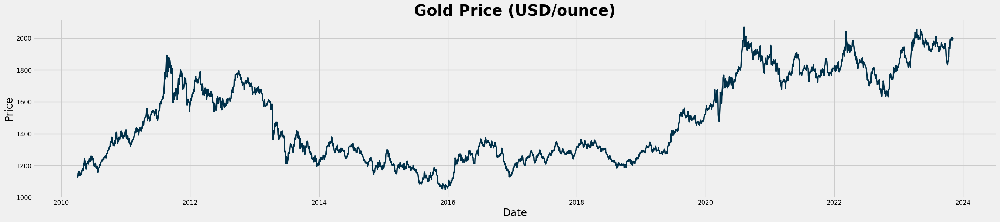

In [81]:
import pandas as pd
import matplotlib.pyplot as plt

# Vẽ biểu đồ
plt.figure(figsize=(30, 6))
plt.plot(gold_df['Date'], gold_df['GOLD_close'], linestyle='-',
         color = '#003049', linewidth = 2.5)
plt.title('Gold Price (USD/ounce)', fontsize=30, weight='bold')
plt.xlabel('Date', fontsize=20)
plt.ylabel('Price', fontsize=20)

plt.grid(True)
plt.show()


The gold price has increased by about 200% over the past 10 years (1110 USD/ounce to 2000 USD/ounce), but it has also experienced several large swings in both directions

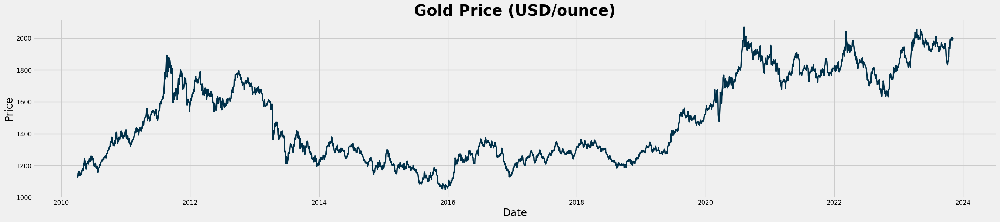

In [82]:
import pandas as pd
import matplotlib.pyplot as plt

# Vẽ biểu đồ
plt.figure(figsize=(30, 6))
plt.plot(gold_df['Date'], gold_df['GOLD_close'], linestyle='-',
         color = '#003049', linewidth = 2.5)
plt.title('Gold Price (USD/ounce)', fontsize=30, weight='bold')
plt.xlabel('Date', fontsize=20)
plt.ylabel('Price', fontsize=20)

plt.grid(True)
plt.show()


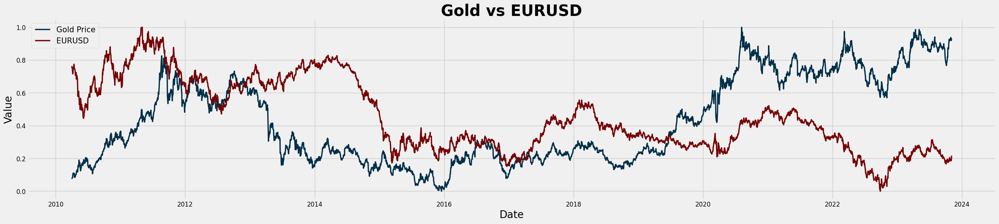

In [83]:
corr(feature = 'EURUSD')

Gold tends to rise when the US dollar is weak, as it becomes cheaper for foreign buyers and reflects the loss of confidence in the reserve currency.

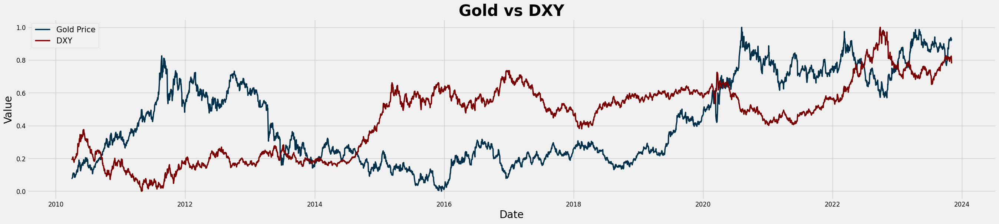

In [84]:
corr(feature = 'DXY')

Gold and other metals like copper, platinum, and silver exhibit a trend that shows significant similarities.

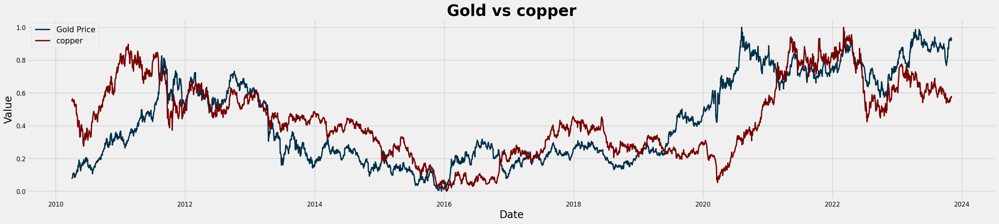

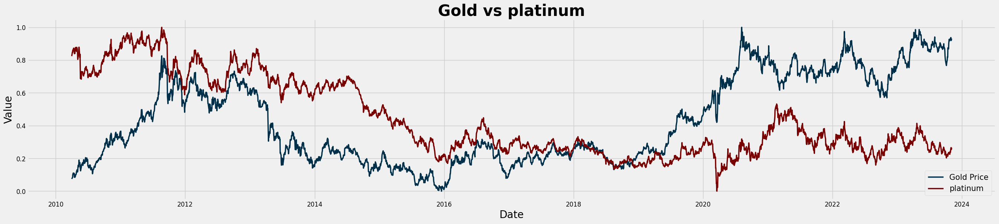

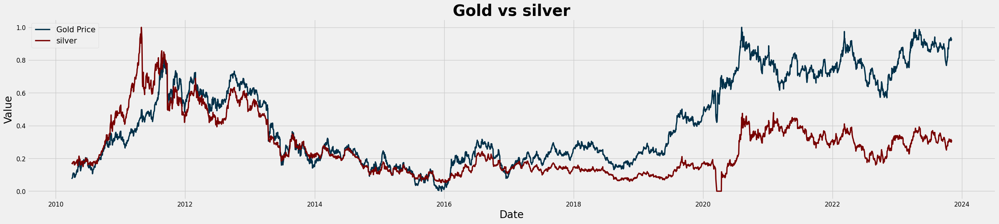

In [85]:
for feature in ['copper', 'platinum', 'silver']:
    if feature == 'Date':
        continue
    corr(feature)

### **2. Outliers**

Outliers exist at 3 columns: ‘NLR’, ‘silver’ and ‘VIX’

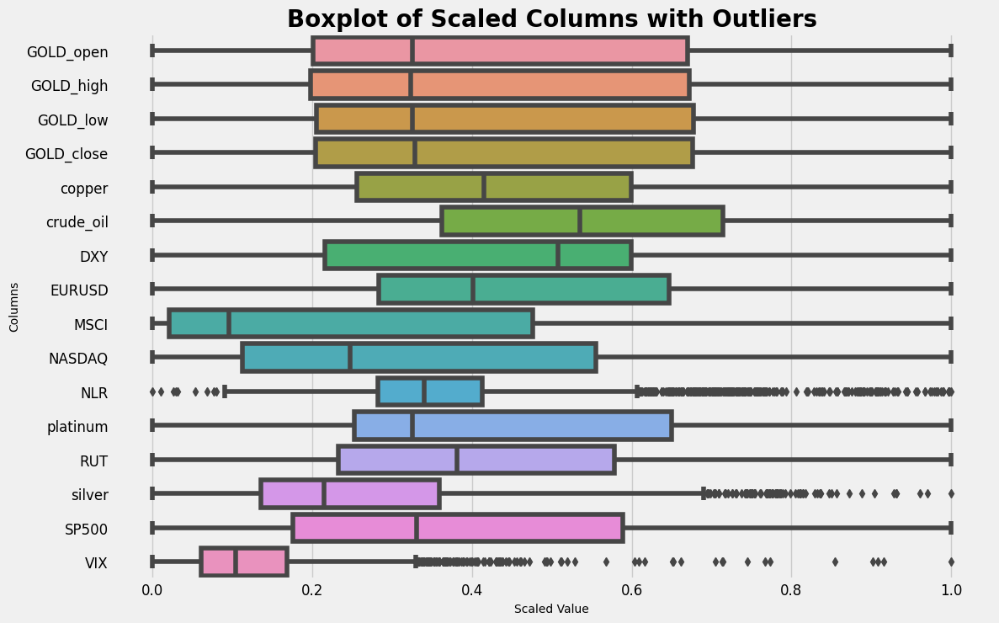

In [86]:
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Lựa chọn các cột dữ liệu để vẽ đồ thị và chuẩn hóa
columns_to_plot = ['GOLD_open', 'GOLD_high', 'GOLD_low', 'GOLD_close', 'copper', 'crude_oil', 'DXY', 'EURUSD', 'MSCI', 'NASDAQ', 'NLR', 'platinum', 'RUT', 'silver', 'SP500', 'VIX']

# Chuẩn hóa dữ liệu
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[columns_to_plot])
scaled_df = pd.DataFrame(scaled_data, columns=columns_to_plot)

plt.figure(figsize=(12, 8))

# Vẽ boxplot cho từng cột dữ liệu đã chuẩn hóa
sns.boxplot(data=scaled_df, orient='h')

plt.title('Boxplot of Scaled Columns with Outliers', fontsize=20, weight='bold')
plt.xlabel('Scaled Value', fontsize=10)
plt.ylabel('Columns', fontsize=10)
plt.show()

In [87]:
import pandas as pd


def outliers(column_name):
    # Tính IQR
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    # Tìm outliers
    outliers = df[(df[column_name] < (Q1 - 1.5 * IQR)) | (df[column_name] > (Q3 + 1.5 * IQR))][column_name]
    print(column_name, outliers.count())

for column in df.columns:
    outliers(column_name = column)

Date 0
GOLD_open 0
GOLD_high 0
GOLD_low 0
GOLD_close 0
copper 0
crude_oil 0
DXY 0
EURUSD 0
MSCI 0
NASDAQ 0
NLR 291
platinum 0
RUT 0
silver 83
SP500 0
VIX 132


There are outliers present in three columns: 'NLR,' 'silver,' and 'VIX.' These outliers are representative of true values stemming from natural variations within the population. Hence, we have decided not to remove these outliers.

In [88]:
import matplotlib.pyplot as plt

def visualize_outlier_over_time(feature):
    # Xác định outliers trong cột 'GOLD_close' sử dụng IQR
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[feature] < (Q1 - 1.5 * IQR)) | (df[feature] > (Q3 + 1.5 * IQR))]

    # Vẽ đồ thị thể hiện outliers theo thời gian
    plt.figure(figsize=(20, 6))
    plt.grid(True)

    plt.scatter(df['Date'], df[feature], label= feature, color='#003049')

    plt.scatter(outliers['Date'], outliers[feature], label='Outliers', color='#780000', s=100, marker='o')

    plt.title('%s with Outliers Over Time' %(feature), fontsize=20, weight='bold')
    plt.xlabel('Date', fontsize=20)
    plt.ylabel('Value', fontsize=20)
    plt.legend()
    plt.show()


#####NLR

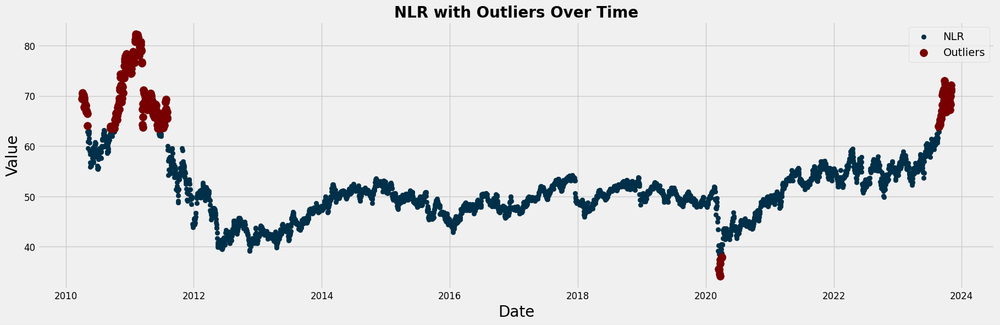

In [89]:
visualize_outlier_over_time(feature = 'NLR')

In the NLR column, outliers are observed around the years 2011, 2020, and 2024

2011, the Fukushima disaster in Japan in 2011 led to a sharp dip in nuclear output as countries took plants offline due to safety concerns

2020, because of COVID-19 Impact, the global nuclear power generation fell by about 3% in Q1 2020 compared with Q1 2019

The 2024 outlier was driven by depleting oil, gas, and coal reserves estimated to exhaust within a century. Nuclear energy emerged as a leading clean and cost-effective electricity source.

##### Silver

Silver has a significant increasing in 2011 because of Global financial crisis aftermath (2008) and Quantitative Easing (QE) programs (announced in November 2010).

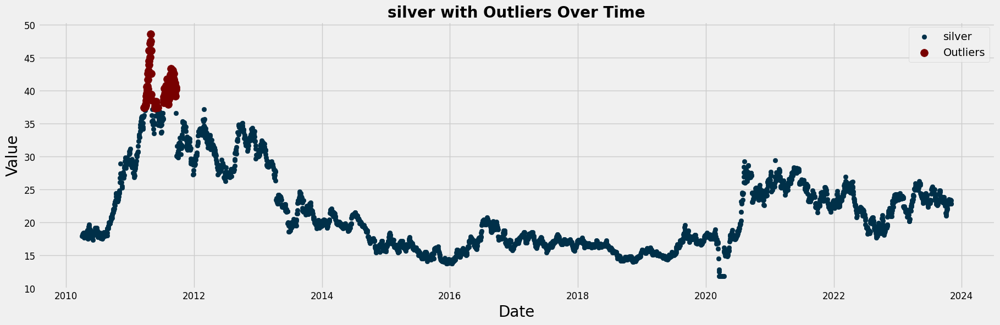

In [90]:
visualize_outlier_over_time(feature = 'silver')

##### VIX

The VIX, or Volatility Index, measures the market’s expectation of future volatility implied by S&P 500 index options. This value has outliers in 2010, 2011, 2015, 2018, 2019, 2020, 2022.

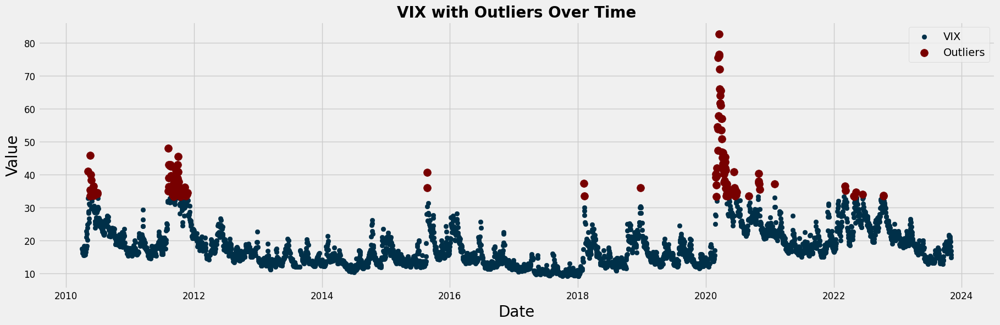

In [91]:
visualize_outlier_over_time(feature = 'VIX')

2010: Flash Crash: The May 6th flash crash caused a sudden and dramatic drop in the S&P 500, sparking a surge in anxiety and volatility expectations.

2011: European Sovereign Debt Crisis: Concerns about Greece's sovereign debt crisis and its potential impact on the global financial system led to increased market volatility and a rise in the VIX.

2015: Chinese Yuan Devaluation: China's surprise devaluation of the yuan in August 2015 raised concerns about a global economic slowdown and triggered a spike in volatility.

2018: Trade Wars: Escalating trade tensions between the US and China fueled market uncertainty and volatility, pushing the VIX higher.

2019: US-Iran Tensions: Rising tensions between the US and Iran over Iran's nuclear program heightened geopolitical anxieties and led to a jump in the VIX.

2020: COVID-19 Pandemic: The outbreak of the COVID-19 pandemic in early 2020 triggered an unprecedented sell-off in the stock market and a record high VIX reading.

2022: Russian Invasion of Ukraine: The Russian invasion of Ukraine in February 2022 caused significant market turmoil and a surge in volatility, reflected in the VIX.

### **4. Seasonality in the gold price data**

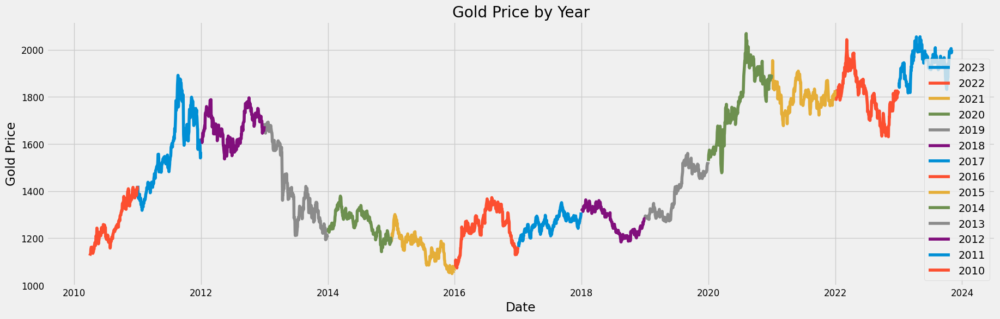

In [92]:
import pandas as pd
import matplotlib.pyplot as plt

gold_data = df.copy()
gold_data['Date'] = pd.to_datetime(gold_data['Date'])

gold_data.set_index('Date', inplace=True)

years = gold_data.index.year.unique()

plt.figure(figsize=(20, 6))

for year in years:
    data_year = gold_data[gold_data.index.year == year]

    plt.plot(data_year.index, data_year['GOLD_close'], label=str(year))

plt.title('Gold Price by Year')
plt.xlabel('Date')
plt.ylabel('Gold Price')
plt.legend()
plt.grid(True)
plt.show()


There is no seasonality trend in Gold price.

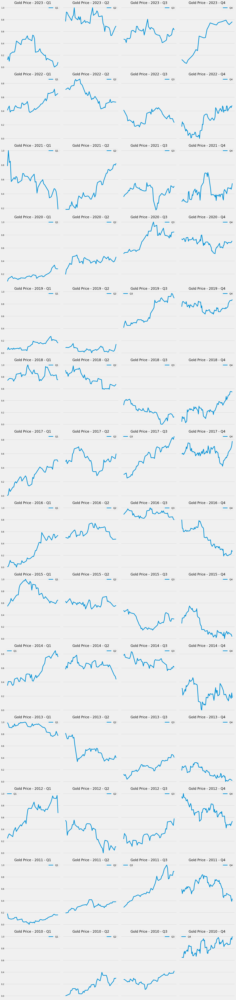

In [93]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


gold_data = df.copy()
gold_data['Date'] = pd.to_datetime(gold_data['Date'])

years = gold_data['Date'].dt.year.unique()

fig, axes = plt.subplots(nrows=len(years), ncols=4, figsize=(20, 6 * len(years)), sharey='row')

for i, year in enumerate(years):
    data_year = gold_data[gold_data['Date'].dt.year == year]

    scaler = MinMaxScaler()
    scaled_price = scaler.fit_transform(data_year['GOLD_close'].values.reshape(-1, 1))

    for j in range(4):  # 4 quý trong một năm
        start_date = pd.Timestamp(year, j * 3 + 1, 1)
        end_date = pd.Timestamp(year, (j + 1) * 3, 1) if j < 3 else pd.Timestamp(year + 1, 1, 1)

        quarter_data = data_year[(data_year['Date'] >= start_date) & (data_year['Date'] < end_date)]
        quarter_scaled_price = scaled_price[(data_year['Date'] >= start_date) & (data_year['Date'] < end_date)]

        ax = axes[i, j]
        ax.plot(quarter_data['Date'], quarter_scaled_price, label=f'Q{j+1}')
        ax.set_title(f'Gold Price - {year} - Q{j+1}')
        ax.set_ylabel('')
        ax.legend()
        ax.grid(True)
        ax.set_xticks([])

plt.tight_layout()
plt.show()


# **daily return, weekly return, monthly return of gold price**

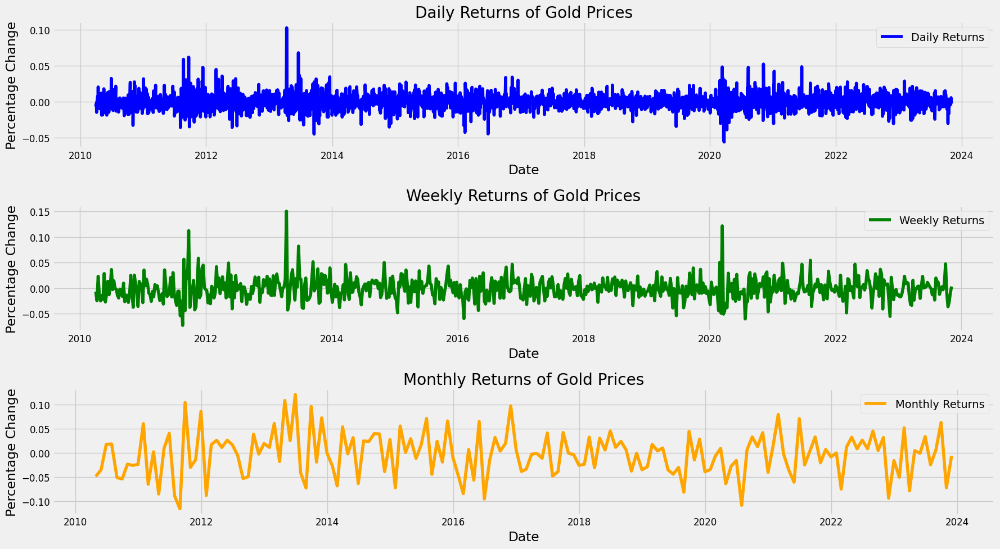

In [94]:
# Assuming 'GOLD_close' is the column containing gold prices
df['date'] = pd.to_datetime(df['Date'])
df.set_index('date', inplace=True)

# Calculate daily returns
daily_return = pd.DataFrame({'daily_close': df['GOLD_close'].pct_change()})

# Resample to weekly returns
weekly_return = daily_return.resample('W').sum()

# Resample to monthly returns
monthly_return = daily_return.resample('M').sum()

# Plotting
plt.figure(figsize=(18, 10))

# Plot daily returns
plt.subplot(3, 1, 1)
plt.plot(daily_return.index, daily_return['daily_close'], label='Daily Returns', color='blue')
plt.title('Daily Returns of Gold Prices')
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.legend()
plt.grid(True)

# Plot weekly returns
plt.subplot(3, 1, 2)
plt.plot(weekly_return.index, weekly_return['daily_close'], label='Weekly Returns', color='green')
plt.title('Weekly Returns of Gold Prices')
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.legend()
plt.grid(True)

# Plot monthly returns
plt.subplot(3, 1, 3)
plt.plot(monthly_return.index, monthly_return['daily_close'], label='Monthly Returns', color='orange')
plt.title('Monthly Returns of Gold Prices')
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# **Volatility of Assets Over Time**

In [95]:
data=pd.DataFrame()



# Calculate daily returns for gold and other assets
# For gold, we'll use the closing price
data['GOLD_return'] = df['GOLD_close'].pct_change()

# Calculate returns for other assets
for column in df.columns:
    if column not in ['Date', 'GOLD_open', 'GOLD_high', 'GOLD_low', 'GOLD_close', 'GOLD_return']:
        data[column + '_return'] = df[column].pct_change()

# Drop the first row as it will have NaN values for returns
data = data.dropna()

# Calculate rolling standard deviation (volatility) for different time periods
# Assuming the data is daily, we'll use 1 day for daily, 5 days for weekly, and 21 days for monthly
volatility_daily = data.std()
volatility_weekly = data.rolling(window=5).std().mean()
volatility_monthly = data.rolling(window=21).std().mean()
# Prepare the results for display
volatility_results = pd.DataFrame({
    'Daily Volatility': volatility_daily,
    'Weekly Volatility': volatility_weekly,
    'Monthly Volatility': volatility_monthly
})
data['Date'] = pd.to_datetime(df['Date'])

volatility_results.sort_index(inplace=True)
volatility_results

,Daily Volatility,Weekly Volatility,Monthly Volatility
DXY_return,0.004523,0.004062,0.004285
EURUSD_return,0.005418,0.004852,0.005110
GOLD_return,0.010138,0.008874,0.009489
MSCI_return,0.019551,0.015707,0.017001
NASDAQ_return,0.013029,0.010766,0.011427
NLR_return,0.012652,0.010278,0.011069
RUT_return,0.014595,0.012067,0.012761
SP500_return,0.011190,0.008869,0.009460
VIX_return,0.075519,0.066778,0.071858
copper_return,0.014193,0.012807,0.013555


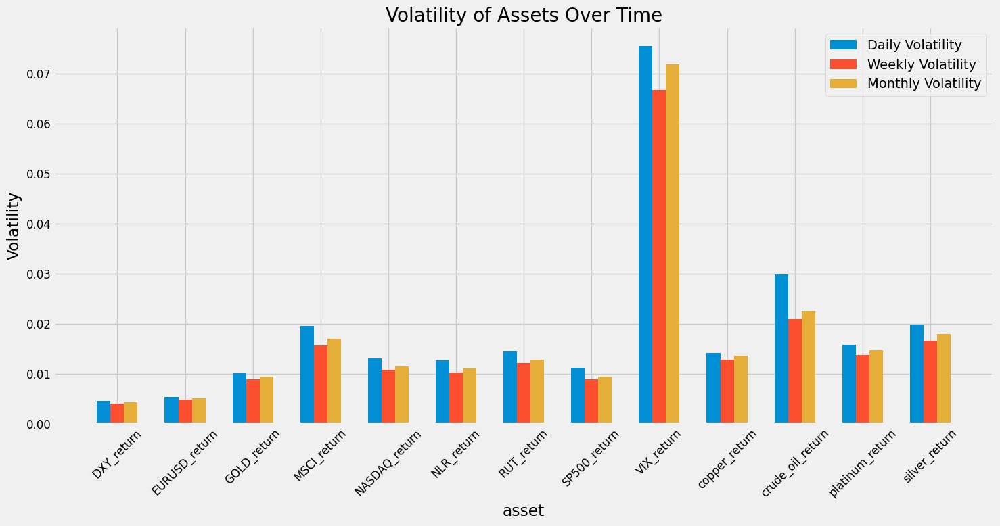

In [96]:
import matplotlib.pyplot as plt

# Assuming 'Date' is in datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Bar chart for volatility
plt.figure(figsize=(15, 8))

# Bar width for better visibility
bar_width = 0.2

# Bar positions
positions_daily = range(len(volatility_results['Daily Volatility']))
positions_weekly = [pos + bar_width for pos in positions_daily]
positions_monthly = [pos + bar_width for pos in positions_weekly]

# Plot bars for each volatility measure
plt.bar(positions_daily, volatility_results['Daily Volatility'], width=bar_width, label='Daily Volatility')
plt.bar(positions_weekly, volatility_results['Weekly Volatility'], width=bar_width, label='Weekly Volatility')
plt.bar(positions_monthly, volatility_results['Monthly Volatility'], width=bar_width, label='Monthly Volatility')
# Set x-axis ticks and labels
plt.xticks(positions_weekly, volatility_results.index,rotation=45)
plt.xlabel('asset')
# Labeling and title
plt.ylabel('Volatility')
plt.title('Volatility of Assets Over Time')
plt.legend()
plt.tight_layout()
plt.show()

Comparing this with other assets:

- *Stock Indices (e.g., NASDAQ, SP500):*
  - NASDAQ has a daily volatility of 1.30%, weekly 1.08%, and monthly 1.14%.
  - S&P 500 shows a daily volatility of 1.12%, weekly 0.89%, and monthly 0.95%.

- *Commodities (e.g., crude oil, copper):*
  - Crude oil is significantly more volatile than gold, with daily volatility of 2.98%, weekly 2.09%, and monthly 2.25%.
  - Copper's volatility is closer to gold, with daily 1.42%, weekly 1.28%, and monthly 1.36%.

- *Other Precious Metals (e.g., silver, platinum):*
  - Silver shows higher volatility than gold: daily 1.99%, weekly 1.65%, and monthly 1.80%.
  - Platinum also has higher volatility: daily 1.58%, weekly 1.37%, and monthly 1.46%.

- *Currencies and Indices (e.g., DXY, EURUSD, VIX):*
  - The DXY index and EURUSD exhibit lower volatility compared to gold.
  - The VIX, an index measuring market volatility, understandably shows the highest volatility figures.

In summary, gold exhibits moderate volatility compared to the analyzed assets. It is less volatile than crude oil, silver, and platinum, but more volatile than major currencies and slightly less or comparably volatile to major stock indices.

# Changes in gold price

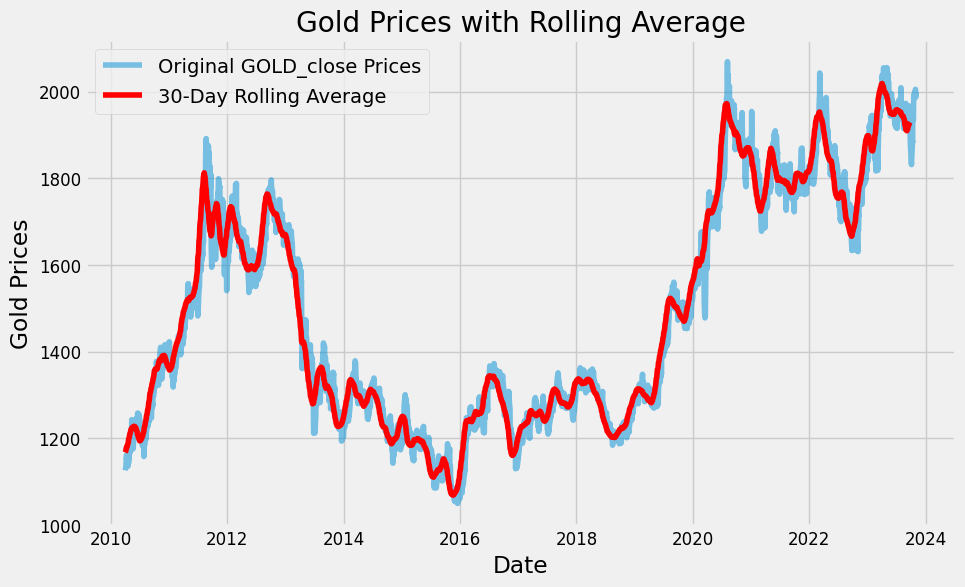

In [97]:
import pandas as pd
import matplotlib.pyplot as plt



# Calculate the rolling average with a window of 30 days
window_size = 30
rolling_avg = df['GOLD_close'].rolling(window=window_size).mean()

# Plotting the original data and the rolling average
plt.figure(figsize=(10, 6))
plt.plot(df['Date'], df['GOLD_close'], label='Original GOLD_close Prices', alpha=0.5)
plt.plot(df['Date'], rolling_avg, label=f'{window_size}-Day Rolling Average', color='red')

plt.xlabel('Date')
plt.ylabel('Gold Prices')
plt.title('Gold Prices with Rolling Average')
plt.legend()
plt.show()


Gold prices tend to rise during periods of uncertainty and risk aversion, as investors seek a safe haven asset that can preserve their purchasing power and hedge against inflation.

• Some of the economic events or crises that have affected gold prices since 2010 are:

• The 2010 European debt crisis, which triggered fears of a sovereign default and a breakup of the eurozone. Gold prices reached a record high of $1,920 in September 2011, as investors fled from the euro and other risky assets.

• The 2011 US debt ceiling impasse, which resulted in the first-ever downgrade of the US credit rating by Standard & Poor's. Gold prices also soared to a record high in August 2011, as investors lost confidence in the US dollar and the ability of the US government to manage its fiscal affairs.

• The 2013 taper tantrum, which occurred when the US Federal Reserve signaled its intention to reduce its quantitative easing program. Gold prices plunged by about 28% in 2013, as investors anticipated higher interest rates and a stronger US dollar.

• The 2014-15 oil price collapse, which was caused by a supply glut and a slowdown in global demand. Gold prices declined by about 10% in 2014 and 12% in 2015, as lower oil prices reduced inflation expectations and boosted the US dollar.

• The 2016 Brexit referendum, which resulted in the UK's decision to leave the European Union. Gold prices surged by about 25% in 2016, as investors sought a safe-haven asset amid the political and economic uncertainty caused by Brexit.

• The 2018-19 US-China trade war, which escalated into a series of tariffs and counter-tariffs between the world's two largest economies. Gold prices rose by about 18% in 2019, as investors feared a global slowdown and a currency war.

• The 2020 COVID-19 pandemic, which caused a severe health and economic crisis around the world. Gold prices reached a new record high of $2,150 in August 2020, as investors sought a safe-haven asset amid the unprecedented monetary and fiscal stimulus, the weak US dollar, and the high inflation expectations.